# Detection of SQL Injection Queries
### Introduction

Databases are a collection of data that are organized in a structured way to facilitate easy access, retrieval, and manipulation of data. Databases are used in a wide range of applications such as e-commerce, banking, healthcare, and many more. Databases can be broadly classified into two categories: relational and non-relational databases.

SQL (Structured Query Language) is a programming language used to manage and manipulate relational databases. SQL queries are used to retrieve, insert, update, and delete data from databases. SQL queries are also used to create and modify database tables, views, and indexes.

Database security is important because databases often contain sensitive and confidential information such as personal information, financial data, and business information. If this information falls into the wrong hands, it can lead to identity theft, financial loss, and reputational damage. Database security involves protecting the database from unauthorized access, modification, and destruction.

SQL injection (SQLi) attack is a type of cyber attack where an attacker injects malicious SQL code into a vulnerable application that uses SQL queries to interact with a database. The attacker can then use this code to gain unauthorized access to the database, steal sensitive data, modify or delete data, and even take control of the entire system. SQL injection attacks are one of the most common and dangerous types of cyber attacks, and they can be prevented by implementing proper security measures such as input validation, parameterized queries, and access control.

### Machine Learning in imporving Security

Machine learning can be used to detect and prevent SQL injection attacks because it can learn patterns of normal behavior in the application's SQL queries and detect anomalies that may indicate an attack. Traditional rule-based systems for detecting SQL injection attacks rely on pre-defined rules and signatures, which can be bypassed by attackers using new and unknown attack techniques. Machine learning models, on the other hand, can adapt to new attack patterns and learn from new data, making them more effective at detecting and preventing SQL injection attacks. Additionally, machine learning can help reduce false positives and improve the accuracy of detection, which can save time and resources for security teams.


In [2]:
# importation of machine learning libraries and data processing modules
import numpy as np
import pandas as pd
import math
import os
import matplotlib.pyplot as plt
import seaborn as sns
from normalizer import *
import plotly.express as px
import plotly.graph_objs as go
from spacytextblob import spacytextblob
import spacy
from function import *
from nltk.corpus import stopwords
from sklearn.utils.extmath import density
from scipy.stats import percentileofscore
from sklearn.feature_extraction.text import CountVectorizer
from scipy.sparse import csr_matrix
from wordcloud import WordCloud, STOPWORDS
from sklearn.ensemble import RandomForestClassifier as RndFC
from sklearn.neighbors import KNeighborsClassifier as KNN
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import train_test_split, cross_val_score, cross_validate
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.metrics import f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay, RocCurveDisplay, roc_curve, auc

In [3]:
# utilize several datasets to improve model accuracy
df1 = pd.read_csv('../Datasets/sqli.csv', encoding='utf-16', engine='c')
df2 = pd.read_csv('../Datasets/SQLi.csv')
df3 = pd.read_csv('../Datasets/SQLi+.csv', encoding='utf-16')
df4 = pd.read_csv('../Datasets/sqliv2.csv', encoding='utf-16')
df5 = pd.read_fwf('../Datasets/sqli_payloads.csv')
#df6 = pd.read_csv('../Datasets/clean_sql_dataset.csv')

In [4]:
df6 = pd.DataFrame()
df6['Query'] = ''
df6['Label'] = None

In [5]:
df1.shape, df2.shape, df3.shape, df4.shape, df5.shape #df6.shape

((4200, 2), (30919, 2), (18900, 2), (33761, 2), (433, 1))

In [6]:
df2.head()

,Query,Label
0,""" or pg_sleep ( __TIME__ ) --",1
1,create user name identified by pass123 tempora...,1
2,AND 1 = utl_inaddr.get_host_address ( ...,1
3,select * from users where id = '1' or @ @1 ...,1
4,"select * from users where id = 1 or 1#"" ( ...",1


In [7]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4200 entries, 0 to 4199
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Sentence  4187 non-null   object
 1   Label     4200 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 65.8+ KB


In [8]:
df5.head()

,Query
0,;%00
1,0 or 1=1
2,|| 1==1
3,1'1
4,1\'1


In [9]:
df6.head()

,Query,Label


creat a column `label` for the dataframe **df5**

In [10]:
df5['Label'] = 1

In [11]:
df1.columns, df2.columns, df3.columns, df4.columns, df5.columns, #df6.columns

(Index(['Sentence', 'Label'], dtype='object'),
 Index(['Query', 'Label'], dtype='object'),
 Index(['sentence', 'type'], dtype='object'),
 Index(['Sentence', 'Label'], dtype='object'),
 Index(['Query', 'Label'], dtype='object'))

In [12]:
df6 = pd.DataFrame()
df6['Query'] = ''
df6['Label'] = None

In [13]:
# dataframe after merging or concatenating the various datasets
#df = pd.concat([df1[['Sentence', 'Label']].rename(columns={'Sentence': 'Query'}), df2[['Query', 'Label']], df3[['sentence', 'type']].rename(columns={'sentence': 'Query', 'type': 'Label'}), df4[['Sentence', 'Label']].rename(columns={'Sentence': 'Query'}), df5[['Query', 'Label']], df6[['Query', 'Label']] ])
df = pd.concat([df1[['Sentence', 'Label']].rename(columns={'Sentence': 'Query'}), df2[['Query', 'Label']], df3[['sentence', 'type']].rename(columns={'sentence': 'Query', 'type': 'Label'}), df4[['Sentence', 'Label']].rename(columns={'Sentence': 'Query'}), df5[['Query', 'Label']] ])
df

,Query,Label
0,a,1
1,a',1
2,a' --,1
3,a' or 1 = 1; --,1
4,@,1
...,...,...
428,x' and userid is NULL; --,1
429,x' AND userid IS NULL; --,1
430,x' or 1=1 or 'x'='y,1
431,x' or full_name like '%bob%,1


In [14]:
df[df.duplicated(keep=False)].sort_values(by=['Query']).value_counts().sum()

39815

* Here we have found  duplicate values.
* Let us remove all the datapoints with duplicates

In [15]:
# drop duplicate values
df.drop_duplicates(keep=False, inplace=True)

In [16]:
# data frame after dropping of duplicates
df.head()

,Query,Label
1126,or 3 = 3 --,1
1128,Add plain text Ne te quaesiveris extra,0
1129,"Man star; soul Render honest perfect man, Com...",0
1131,Epilogue Beaumont Fletcher’s Honest Man’s For...,0
1186,"On saying, What I sacredness traditions, I li...",0


In [17]:
# dropping empty query
for i in range(df.shape[0]):
    if df['Query'].iloc[i].strip() == "":
        print("Index", i, "has an empty query")
df.head()

Index 11567 has an empty query


,Query,Label
1126,or 3 = 3 --,1
1128,Add plain text Ne te quaesiveris extra,0
1129,"Man star; soul Render honest perfect man, Com...",0
1131,Epilogue Beaumont Fletcher’s Honest Man’s For...,0
1186,"On saying, What I sacredness traditions, I li...",0


In [18]:
df[df['Query'].isna()]

,Query,Label


In [19]:
df['Label'].value_counts()

0    25679
1    22682
Name: Label, dtype: int64

<Axes: >

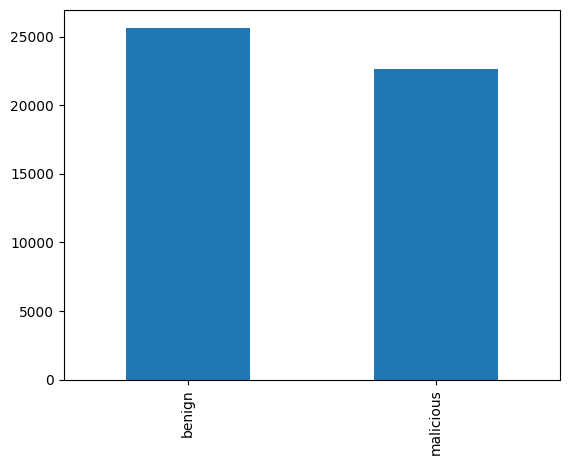

In [20]:
df['Label'].value_counts().rename({0: 'benign', 1: 'malicious'}).plot(kind='bar')
#df['Label'].value_counts().rename({0: 'benign', 1: 'malicious'}).plot(kind='barh')
#f['Label'] #.plot(kind='bar')


In [21]:
df['Label'].value_counts().index

Int64Index([0, 1], dtype='int64')

In [22]:
df['Label'].value_counts()

0    25679
1    22682
Name: Label, dtype: int64

- **Positive class** - 25644
- **Negative class** - 14016

<p>Dataset is slightly balanced with positive to negative class ratio of **50.6%**  to **49.4%**</p>

In [23]:
samples = df['Query'][:9780]

In [24]:
# removing whitespaces in the query label
df['Query'] = df['Query'].astype(str).apply(clean_whitespaces)
df.head()

,Query,Label
1126,or 3 = 3 --,1
1128,add plain text ne te quaesiveris extra,0
1129,"man star; soul render honest perfect man, comm...",0
1131,epilogue beaumont fletcher’s honest man’s fort...,0
1186,"on saying, what i sacredness traditions, i liv...",0


In [25]:
#df['Query'][55341]

In [26]:
df.duplicated().sum()

10159

In [27]:
df.drop_duplicates(keep='first', inplace=True)
df.shape
df.head()

,Query,Label
1126,or 3 = 3 --,1
1128,add plain text ne te quaesiveris extra,0
1129,"man star; soul render honest perfect man, comm...",0
1131,epilogue beaumont fletcher’s honest man’s fort...,0
1186,"on saying, what i sacredness traditions, i liv...",0


**Special Characters Count**  
Let's find out if number of special characters in the query has any relation with dependent variable.

In [28]:
no_of_special_chars = df['Query'].astype(str).map(lambda x:len(re.findall('[^a-zA-Z0-9\s]',x)))
no_of_special_chars.describe()

count    38202.000000
mean         7.543061
std         12.810432
min          0.000000
25%          0.000000
50%          3.000000
75%         10.000000
max        605.000000
Name: Query, dtype: float64

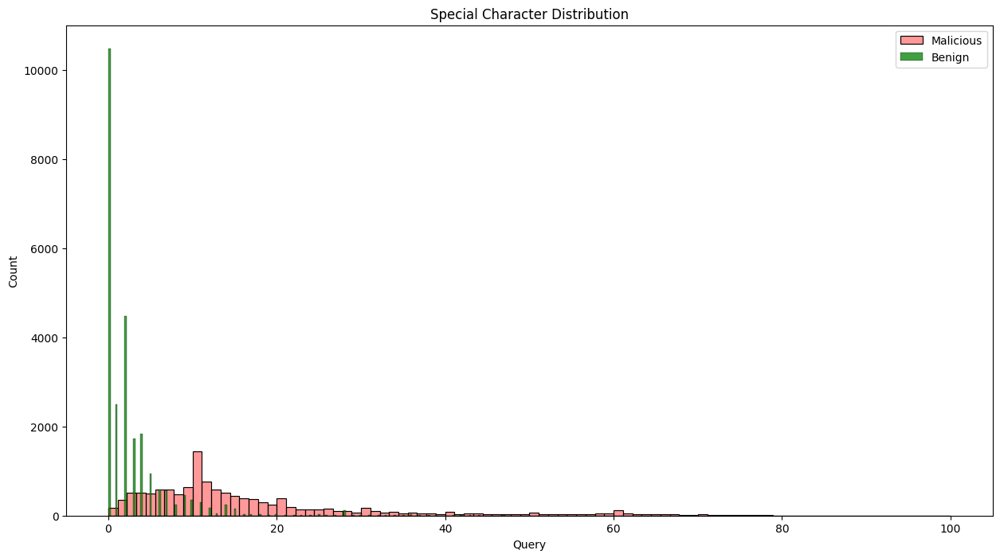

In [29]:
fig3, ax_sc = plt.subplots(1, 1, figsize=(15,8))
sns.histplot(no_of_special_chars[df['Label']==1], ax=ax_sc, color='red', label='Malicious', binrange=(0,100) ,alpha=0.4)
sns.histplot(no_of_special_chars[df['Label']==0], ax=ax_sc, color='green', label='Benign', binrange=(0,100))
ax_sc.set_title("Special Character Distribution")
ax_sc.legend()

## Query Length Distribution

In [30]:
query_length = df.Query.map(lambda x:len(x.split()))
query_length.describe()

count    38202.000000
mean        11.325035
std         14.940762
min          0.000000
25%          1.000000
50%          8.000000
75%         14.000000
max        394.000000
Name: Query, dtype: float64

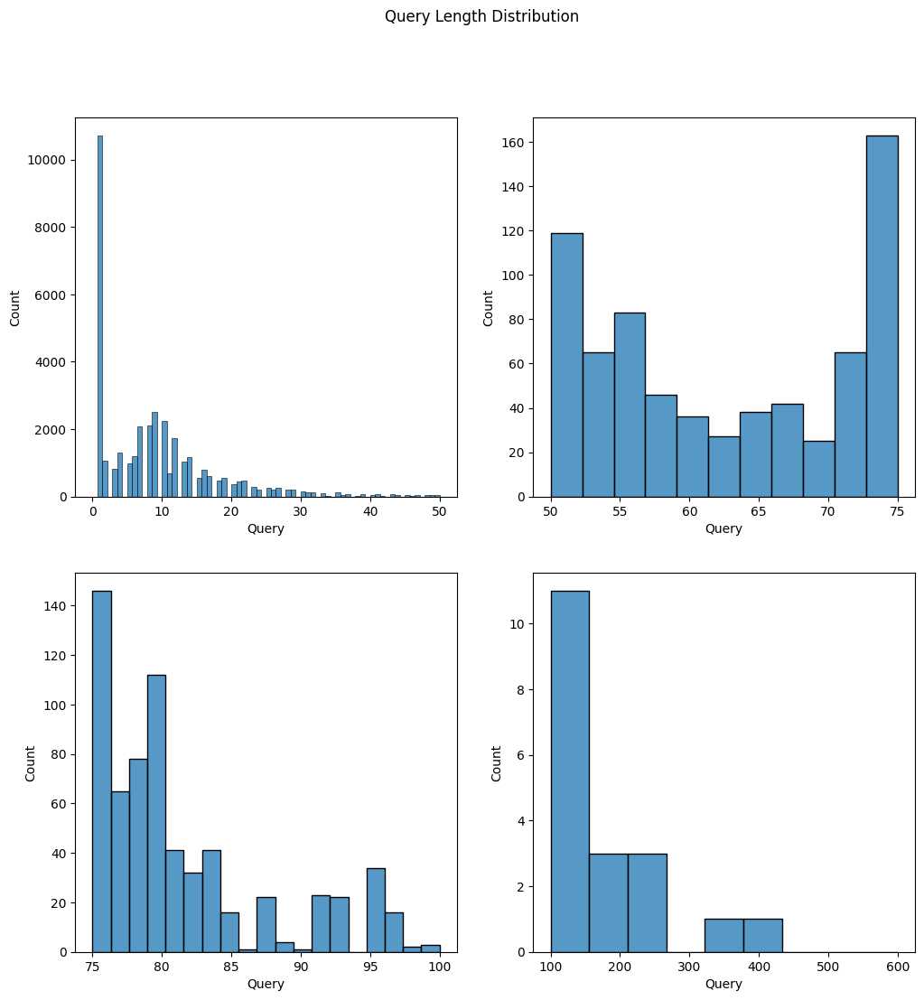

In [31]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12,12))
sns.histplot(query_length, binrange=(0,50), ax=ax1)
sns.histplot(query_length, binrange=(50,75), ax=ax2)
sns.histplot(query_length, binrange=(75,100), ax=ax3)
sns.histplot(query_length, binrange=(100,600), ax=ax4)
plt.suptitle("Query Length Distribution");

In [32]:
df[df['Query'] == 0].index

Int64Index([], dtype='int64')

In [33]:
df.drop(index=df[df['Query'] == 0].index, inplace=True)

In [34]:
df[df['Query'].map(lambda x:len(x.split()))==0].index

Int64Index([19323], dtype='int64')

In [35]:
df.drop(index=df[df['Query'].map(lambda x:len(x.split()))==0].index, inplace=True)

In [36]:
benign_queries = df[df['Label']==0]
malicious_queries = df[df['Label']==1]

In [37]:
benign_queries_length = benign_queries.Query.map(lambda x:len(x.split()))
malicious_queries_length = malicious_queries.Query.map(lambda x:len(x.split()))

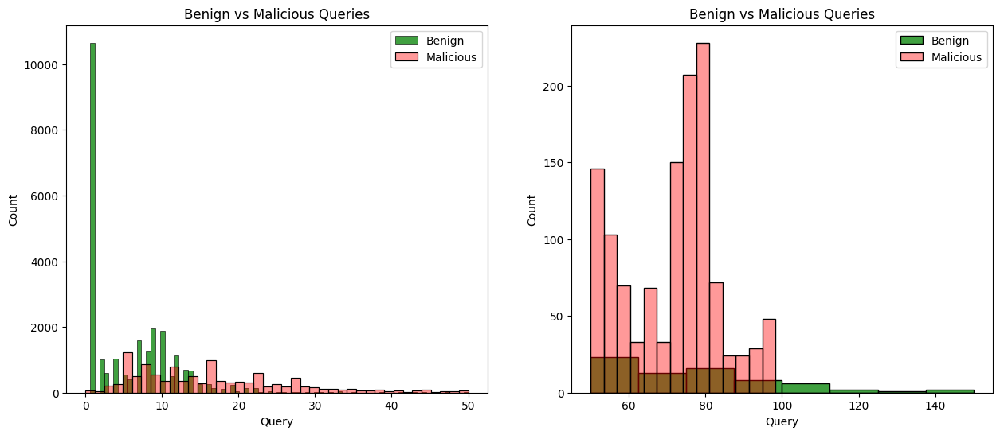

In [38]:
fig2, ((ax21, ax22)) = plt.subplots(1, 2, figsize=(15,6))
sns.histplot(benign_queries_length, binrange=(0,50), ax=ax21, color='green', label='Benign')
sns.histplot(benign_queries_length, binrange=(50,150), ax=ax22, color='green', label='Benign')
sns.histplot(malicious_queries_length, binrange=(0,50), ax=ax21, color='red', label='Malicious', alpha=0.4)
sns.histplot(malicious_queries_length, binrange=(50,150), ax=ax22, color='red', label='Malicious', alpha=0.4)
ax21.set_title("Benign vs Malicious Queries")
ax22.set_title("Benign vs Malicious Queries")
ax21.legend()
ax22.legend()

In [39]:
reserved_words_df.iloc[461]['Word'], type(reserved_words_df.iloc[461]['Word'])

(nan, float)

In [40]:
reserved_words_df.head()

,Word
0,a
1,abort
2,abs
3,absolute
4,access


In [41]:
reserved_words_df.fillna('null', inplace=True)

In [42]:
reserved_words_df.iloc[461]['Word'], type(reserved_words_df.iloc[461]['Word'])

('null', str)

In [43]:
df.head()

,Query,Label
1126,or 3 = 3 --,1
1128,add plain text ne te quaesiveris extra,0
1129,"man star; soul render honest perfect man, comm...",0
1131,epilogue beaumont fletcher’s honest man’s fort...,0
1186,"on saying, what i sacredness traditions, i liv...",0


In [44]:
#sns.scatterplot(x='Query', y='Label', hue=df['Label']==1, data=df)

In [45]:
scat = pd.DataFrame()
def func(Label):
    if Label == 1:
        return 'malicious'
    else:
        return 'benign'
        
scat['Query'] = df['Label'].apply(func)

# plt.scatter(x=scatter['Query'], y=scatter['Label'])
# plt.show()

In [46]:
scat

,Query
1126,malicious
1128,benign
1129,benign
1131,benign
1186,benign
...,...
416,malicious
418,malicious
419,malicious
422,malicious


<Axes: xlabel='Query', ylabel='Query'>

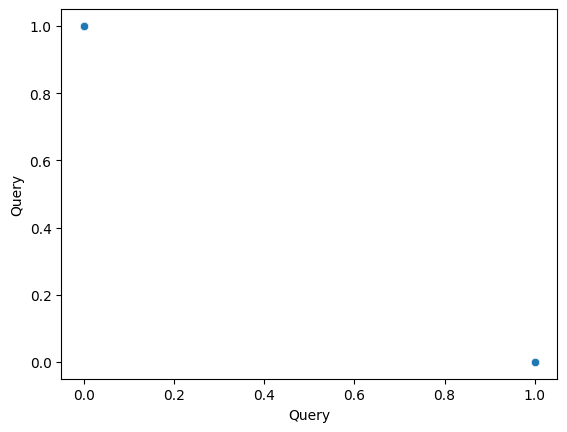

In [47]:
sns.scatterplot(x=scat['Query']=='malicious', y=scat['Query']=='benign')

In [48]:
mod_data = df.copy()

In [49]:
mod_data['SQLIA'] = mod_data['Label'].apply(bool)
mod_data.drop('Label', axis=1, inplace=True)

In [50]:
# Character length feature

mod_data['char_len'] = mod_data['Query'].apply(len)
mod_data['char_len'].describe()

count    38201.000000
mean        56.695741
std         74.526675
min          1.000000
25%         16.000000
50%         41.000000
75%         71.000000
max       5262.000000
Name: char_len, dtype: float64

In [51]:
# processing 'Query' column

mod_data['query_proc'] = mod_data['Query'].apply(replace_num_hex)

mod_data[['Query', 'query_proc']].head()

,Query,query_proc
1126,or 3 = 3 --,or <num> = <num> --
1128,add plain text ne te quaesiveris extra,add plain text ne te quaesiveris extra
1129,"man star; soul render honest perfect man, comm...","man star; soul render honest perfect man, comm..."
1131,epilogue beaumont fletcher’s honest man’s fort...,epilogue beaumont fletcher’s honest man’s fort...
1186,"on saying, what i sacredness traditions, i liv...","on saying, what i sacredness traditions, i liv..."


In [52]:
mod_data['small'] = mod_data['Query'].str.lower()

In [53]:
def word_count(query):
    
    '''
    This function gives the number of words in the input query
    '''
    return len(query.split())

# word length feature
mod_data['word_len'] = mod_data['Query'].apply(word_count)
mod_data['word_len'].describe()

count    38201.000000
mean        11.325332
std         14.940846
min          1.000000
25%          1.000000
50%          8.000000
75%         14.000000
max        394.000000
Name: word_len, dtype: float64

In [54]:
# Plotting word length vs character length
fig = px.scatter(mod_data, x="char_len", y="word_len", color="SQLIA", title='Character length vs Word length of SQLIA and normal queries')
fig.show()

In [55]:
mod_data['SQLIA'][18505]

False

In [56]:
# finding the outlier

outlier_char_len = mod_data['char_len'].max()
outlier_word_len = mod_data['word_len'].max()
outlier = mod_data[(mod_data['char_len']==outlier_char_len) & (mod_data['word_len']==outlier_word_len)]
print(outlier['Query'])

Series([], Name: Query, dtype: object)


no outlier

In [57]:
fig = px.scatter(mod_data, x="char_len", y="word_len", color="SQLIA", title='Character length vs Word length of SQLIA and normal queries')
fig.show()

In [58]:
mod_data[(mod_data['char_len']==outlier_char_len) & (mod_data['word_len']==outlier_word_len)]

,Query,SQLIA,char_len,query_proc,small,word_len


In [59]:
fig = px.violin(mod_data, y="char_len", color="SQLIA", title='Character Length distribution for SQLIA and normal queries')
fig.show()

In [60]:
mod_data['has_keywords'] = mod_data['small'].apply(contains_reserved_words)
mod_data['has_keywords'].value_counts()

True     24836
False    13365
Name: has_keywords, dtype: int64

In [61]:
def is_complete(query):
    
    '''
    This function returns a value to indicate if a query is complete or not.
    Completeness is determined here by finding if the query starts with a reserved SQL keyword.
    Parameter query: (str) Query whose completeness needs to be determined
    Returns value (bool) which is True if the query is complete
    '''
    query = str(query)
    for w in reserved_words:
        if query.startswith(str(w)):
            if not (query.endswith("'") or query.endswith('"')):
                return True
    return False
mod_data['is_complete_query'] = mod_data['small'].apply(lambda x: is_complete(x))

In [62]:
mod_data['Query'][0]

0    " or pg_sleep ( __time__ ) --
0                             ;%00
Name: Query, dtype: object

In [63]:
mod_data['Query'][1][0]

'0'

In [64]:
# plotting histogram of count of complete and incomplete queries

px.histogram(mod_data, x='is_complete_query', color='SQLIA', title='Query type vs Query Completeness')

In [65]:
# printing sqlparse token types for some random chunk of queries from our dataset
import sqlparse
a = 21

for i in range(a,a+10):
    if mod_data['is_complete_query'][i].any():
        print("===========================================================")
        print("Query:", mod_data['Query'])
        print()
        parsed = sqlparse.parse((mod_data.iloc[i]['Query']))
        s = ""
        for t in parsed:
            
            # skipping whitespace tokens
            if t.ttype != None and t.ttype[-1] != 'Whitespace':
                 print(t.value, "<" + t.ttype[-1] + ">")
            if t.ttype == None:
                print(t.value, "<None>")
        print()

Query: 1126                                          or 3 = 3 --
1128               add plain text ne te quaesiveris extra
1129    man star; soul render honest perfect man, comm...
1131    epilogue beaumont fletcher’s honest man’s fort...
1186    on saying, what i sacredness traditions, i liv...
                              ...                        
416                     ');waitfor delay '0:0:__time__'--
418                     ));waitfor delay '0:0:__time__'--
419                      );waitfor delay '0:0:__time__'--
422           x' and 1=(select count(*) from tabname); --
430                                   x' or 1=1 or 'x'='y
Name: Query, Length: 38201, dtype: object

admin' or 1 = 1# <None>

Query: 1126                                          or 3 = 3 --
1128               add plain text ne te quaesiveris extra
1129    man star; soul render honest perfect man, comm...
1131    epilogue beaumont fletcher’s honest man’s fort...
1186    on saying, what i sacredness traditions,

In [66]:
indices = np.zeros(mod_data.shape[0], dtype=bool) # array of query indices

# find always true statements
for ind in range(mod_data.shape[0]):
    q = mod_data.iloc[ind]['small']
    if "=" in q:
        w = q.split("=")
        if len(w) >= 2:
            for i in range(1, len(w)):
                try:
                    w1 = w[i-1].split()[-1]
                    w2 = w[i].split()[0]
                except IndexError:
                    continue
                if (not w1.startswith("'")) and w1.endswith("'"): # a' = 'a'
                    w1 = "'" + w1
                elif w2.startswith("'") and not w2.endswith("'"): # 'a' = 'a
                    w2 += "'"
                if w1==w2:
                    indices[ind] = True

In [67]:
mod_data['always_true'] = pd.Series(indices, index=mod_data.index)

In [68]:
mod_data['always_true'].value_counts()

False    32102
True      6099
Name: always_true, dtype: int64

In [69]:
px.histogram(mod_data, x='always_true', color='SQLIA', title='Number of always true statements in SQLIA and normal queries')

In [70]:
vectorizer = CountVectorizer(ngram_range=(1, 2), min_df=20)
X = vectorizer.fit_transform(mod_data['query_proc'])

In [71]:
#X_sparse = csr_matrix(X)

In [72]:
vec_features = vectorizer.get_feature_names_out() # get list of all N-grams generated
#tfidf_embed = pd.DataFrame(X.toarray(), columns=vec_features, index=mod_data.index) # create DataFrame of token counts
token_count_df = pd.DataFrame(X.toarray(), columns=vec_features, index=mod_data.index) # create DataFrame of token counts# create DataFrame of token counts
print(vec_features[:50])

['__time__' 'abcdefg' 'abcdefg upper' 'above' 'abs' 'account' 'accurate'
 'acf' 'acf field' 'action' 'active' 'activity' 'add' 'addition' 'address'
 'address city' 'admin' 'admin or' 'adult' 'af' 'af num' 'affect' 'again'
 'ago' 'aid' 'airplane' 'alike' 'alive' 'all' 'all select'
 'all selectchar' 'all_users' 'all_users num' 'alter' 'alter table'
 'although' 'am' 'amount' 'analyse' 'analyse extractvalue' 'and'
 'and char' 'and city' 'and elt' 'and exp' 'and extractvalue'
 'and make_set' 'and not' 'and num' 'and row']


In [73]:
# vec_features = vectorizer.get_feature_names_out() # get list of all N-grams generated
# token_count_df = pd.DataFrame.sparse.from_spmatrix(X_sparse, columns=vec_features, index=mod_data.index) # create DataFrame of token counts
# #token_count_df = pd.DataFrame(X.toarray(), columns=vec_features, index=mod_data.index) # create DataFrame of token counts
# print(vec_features[:50])

In [74]:
token_count_df.head()

,__time__,abcdefg,abcdefg upper,above,abs,account,accurate,acf,acf field,action,...,ydpu and,year,yes,yesterday,yet,young,your,yourself,youth,zulu
1126,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1128,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1129,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1131,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1186,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [75]:
sqlia_count = token_count_df[mod_data['SQLIA']==True].sum(axis=0)
normal_count = token_count_df[mod_data['SQLIA']==False].sum(axis=0)
total_count = token_count_df.sum(axis=0)

# contingency table
cont_table = pd.concat([sqlia_count, normal_count, total_count], axis=1, keys=['SQLIA', 'Normal', 'Total'])
cont_table.head()

,SQLIA,Normal,Total
__time__,66,0,66
abcdefg,227,0,227
abcdefg upper,227,0,227
above,0,29,29
abs,0,82,82


In [76]:
# we will use num_q to calculate the number of SQLIA queries, normal queries and total queries
num_q = mod_data['SQLIA'].value_counts()
num_q

False    25644
True     12557
Name: SQLIA, dtype: int64

In [77]:
num_normal = num_q[False]
num_sqlia = num_q[True]
num_total = num_normal + num_sqlia

In [78]:
# calculating the expected count of token in both types of queries

cont_table['Expected SQLIA'] = cont_table['SQLIA'] * num_sqlia/num_total
cont_table['Expected Normal'] = cont_table['Normal'] * num_normal/num_total
cont_table.head()

,SQLIA,Normal,Total,Expected SQLIA,Expected Normal
__time__,66,0,66,21.694772,0.000000
abcdefg,227,0,227,74.616869,0.000000
abcdefg upper,227,0,227,74.616869,0.000000
above,0,29,29,0.000000,19.467448
abs,0,82,82,0.000000,55.045889


In [79]:
del df1, df2, df3, df4, df5, df6 # freeing memory 

In [80]:
# computing PLR and NLR

def get_likelihood_ratio(q_type):
    
    '''
    This function returns the likelihood ratios or g-scores for given query type, based on the contingency table.
    Parameter q_type: (str) Query type. Either 'SQLIA' or 'Normal'
    Returns lr: (numpy.ndarray) Array of g-scores
    '''
    assert (q_type=='SQLIA' or q_type=='Normal')
    lr = np.zeros(token_count_df.shape[1])
    for i in range(token_count_df.shape[1]):
        count = cont_table.iloc[i][q_type]
        exp = cont_table.iloc[i]['Expected ' + q_type]
        if count == 0:
            continue
        elif exp == 0:
            lr[i] = float('inf')
        else:
            lr[i] = 2 * count * math.log(count/exp)
    return lr

cont_table['PLR'] = get_likelihood_ratio('SQLIA')
cont_table['NLR'] = get_likelihood_ratio('Normal')
cont_table.head()

,SQLIA,Normal,Total,Expected SQLIA,Expected Normal,PLR,NLR
__time__,66,0,66,21.694772,0.000000,146.861011,0.000000
abcdefg,227,0,227,74.616869,0.000000,505.112870,0.000000
abcdefg upper,227,0,227,74.616869,0.000000,505.112870,0.000000
above,0,29,29,0.000000,19.467448,0.000000,23.116020
abs,0,82,82,0.000000,55.045889,0.000000,65.362539


In [81]:
cont_table['PLR_percentile'] = [percentileofscore(cont_table['PLR'].values, i) for i in cont_table['PLR'].values]
cont_table['NLR_percentile'] = [percentileofscore(cont_table['NLR'].values, i) for i in cont_table['NLR'].values]
cont_table.head()

,SQLIA,Normal,Total,Expected SQLIA,Expected Normal,PLR,NLR,PLR_percentile,NLR_percentile
__time__,66,0,66,21.694772,0.000000,146.861011,0.000000,78.048780,9.684362
abcdefg,227,0,227,74.616869,0.000000,505.112870,0.000000,88.952654,9.684362
abcdefg upper,227,0,227,74.616869,0.000000,505.112870,0.000000,88.952654,9.684362
above,0,29,29,0.000000,19.467448,0.000000,23.116020,32.747489,74.103300
abs,0,82,82,0.000000,55.045889,0.000000,65.362539,32.747489,86.441894


In [82]:
# Tokens with percentiles above 75 and below 25 for both PLR and NLR will not be considered for analysis.

high = 75
low = 25
invalid_tokens = []
for i in range(cont_table.shape[0]):
    p = cont_table.iloc[i]['PLR_percentile']
    n = cont_table.iloc[i]['NLR_percentile']
    if (min(p, n) > high) or (max(p, n) < low):
        invalid_tokens.append(cont_table.index[i])

cont_table_mod = cont_table.drop(index=invalid_tokens)

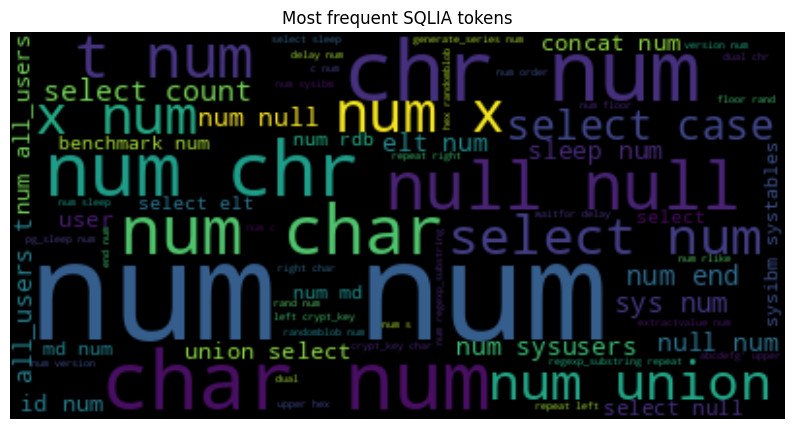

In [83]:
# Source: https://www.datacamp.com/community/tutorials/wordcloud-python
stopwords = set(STOPWORDS)
stopwords.update(invalid_tokens)

sqlia_text = " ".join(mod_data[mod_data['SQLIA']==True]['query_proc'].to_list())
sqlia_wordcloud = WordCloud().generate(sqlia_text)

normal_text = " ".join(mod_data[mod_data['SQLIA']==False]['query_proc'].to_list())
normal_wordcloud = WordCloud().generate(normal_text)

plt.figure(figsize=(10,7))
plt.imshow(sqlia_wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Most frequent SQLIA tokens")
plt.show()

In [84]:
mod_data.corr()['SQLIA'].sort_values()

/tmp/ipykernel_7963/3258808806.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



is_complete_query   -0.363873
char_len             0.356128
has_keywords         0.475819
word_len             0.487606
always_true          0.616351
SQLIA                1.000000
Name: SQLIA, dtype: float64

/tmp/ipykernel_7963/1145351177.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<Axes: >

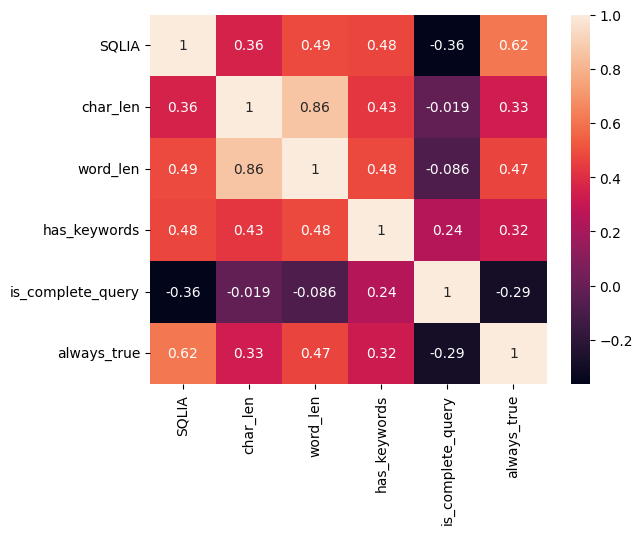

In [85]:
sns.heatmap(mod_data.corr(), annot=True)

In [86]:
corr_matrix = mod_data.corr()

fig = go.Figure(data=go.Heatmap(
    z=corr_matrix.values,
    x=corr_matrix.columns,
    y=corr_matrix.columns,
    ))

# Add text annotations with correlation values
for i in range(len(corr_matrix.columns)):
    for j in range(len(corr_matrix.columns)):
        fig.add_annotation(
            x=corr_matrix.columns[i],
            y=corr_matrix.columns[j],
            text=str(round(corr_matrix.iloc[i, j], 2)),
            showarrow=False,
            font=dict(size=9),
            xshift=-10,
            yshift=-5)

fig.show()

/tmp/ipykernel_7963/915829300.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



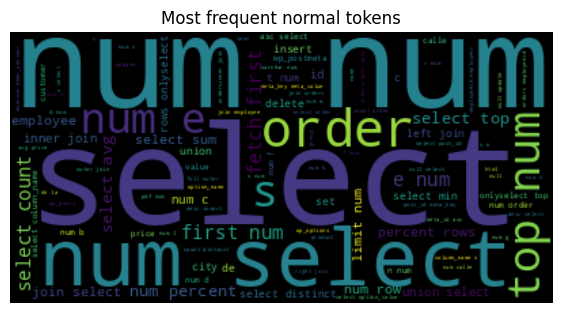

In [87]:
plt.figure(figsize=(7,4))
plt.imshow(normal_wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Most frequent normal tokens")
plt.show()

In [88]:
# finding top 10 tokens

def find_top(is_sqlia, N):
    
    '''
    This function finds the top N tokens which are most frequent in given query type
    Parameter is_sqlia: (bool) True if we want the top N tokens of SQLIA queries
    Returns the top N tokens as a dataframe, with their respective count values
    '''
    df = token_count_df[mod_data['SQLIA']==is_sqlia]
    return df.sum(axis=0).sort_values(ascending=False).head(N)
sqlia_top_10 = find_top(True, 10)
normal_top_10 = find_top(False, 10)

In [89]:
fig= px.bar(x=sqlia_top_10.index.values, y=sqlia_top_10.values, title='Top 10 SQLIA tokens')
fig.update_xaxes(title_text='SQLIA Tokens')

fig.show()

In [90]:
fig = px.bar(x=normal_top_10.index.values, y=normal_top_10.values, title='Top 10 normal query tokens')

fig.update_xaxes(title_text='Normal Tokens')

fig.show()

In [91]:
def get_top_N_tokens(col, N):
    
    '''
    This function returns the 'N' tokens having highest value of 'col'
    Parameter col: (str) positive or negative likelihood ratio. Permitted values: 'PLR', 'NLR'
    Parameter N: (int) number of top tokens to return
    Returns a numpy array of top tokens
    '''
    assert (col=='PLR' or col=='NLR')
    return np.array(cont_table_mod.sort_values(by=col, ascending=False).index[:N])

top_10_sqli_tokens = get_top_N_tokens('PLR', 10)
top_10_normal_tokens = get_top_N_tokens('NLR', 10)

In [92]:
# Plotting the top 10 tokens in a PLR vs NLR scatterplot
tokens = np.concatenate((top_10_sqli_tokens, top_10_normal_tokens))
px.scatter(x=cont_table.loc[tokens]['NLR'], y=cont_table.loc[tokens]['PLR'], hover_name=tokens, title='PLR vs NLR: Top 20 tokens')

In [93]:
nlp = spacy.load('en_core_web_sm') # Language object - pipeline trained in English
nlp.add_pipe('spacytextblob') # custom textblob component to pipeline

In [95]:
def get_polarity(query):

    doc = nlp(query)
    return doc._.blob.polarity

if os.path.exists('sentiment_polarities.csv'):
    os.remove('sentiment_polarities.csv')
    mod_data['sent_pol'] = pd.read_csv('sentiment_polarities.csv', index_col=0)
else:
    mod_data['sent_pol'] = mod_data['Query'].apply(get_polarity)
    mod_data['sent_pol'].to_csv('sentiment_polarities.csv')    
mod_data['sent_pol'].describe()

count    38201.000000
mean         0.013995
std          0.155936
min         -1.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: sent_pol, dtype: float64

In [96]:
# getting the count of positive, negative and neutral queries
mod_data['sent_pol'].apply(np.sign).value_counts()

 0.0    30600
 1.0     4774
-1.0     2827
Name: sent_pol, dtype: int64

- Most queries have neutral sentiment.
- The number of positive sentiment queries is double that of negative ones.

Let's plot the distributions of the polarities for each query type.

In [97]:
px.violin(mod_data, y='sent_pol', color='SQLIA', title='Sentiment Polarities of SQLIA and normal queries')

### Entropy Analysis

Entropy can help identify changes in the query pattern that may indicate a malicious attempt to inject the database. 
This approach is based on the idea that malicious queries often exhibit different entropy patterns compared to benign queries.

Entropy analysis serves as a valuable metric for identifying malicious activity within queries.
It involves finding a threshold that minimizes false positives while capturing as much malicious activity as possible.

Mathematical formulae of calculating an entropy value

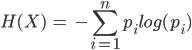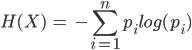


In [98]:
from collections import Counter
def entropy(s):
    p, l = Counter(s.split()), float(len(s.split()))
    return -sum( count/l * math.log(count/l, 2) for count in p.values())
mod_data['entropy'] = mod_data['small'].apply(entropy)
mod_data['entropy'].head()

1126    1.921928
1128    2.807355
1129    3.906891
1131    4.247928
1186    4.058814
Name: entropy, dtype: float64

In [99]:
# plotting the distribution of entropy for SQLIA and normal queries

px.violin(mod_data, y='entropy', color='SQLIA', title='Entropy distribution of SQLIA and Normal Queries')

In [100]:
mod_data.corr()['SQLIA'].sort_values()

/tmp/ipykernel_7963/3258808806.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



is_complete_query   -0.363873
sent_pol            -0.183423
char_len             0.356128
entropy              0.473528
has_keywords         0.475819
word_len             0.487606
always_true          0.616351
SQLIA                1.000000
Name: SQLIA, dtype: float64

/tmp/ipykernel_7963/1901707128.py:7: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.

/tmp/ipykernel_7963/1901707128.py:8: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/tmp/ipykernel_7963/1901707128.py:8: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist

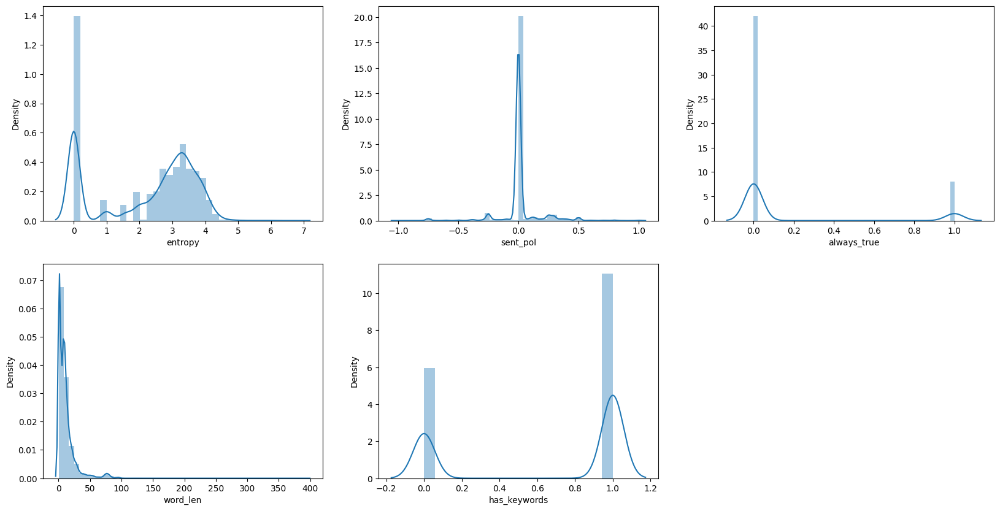

In [101]:
# distribution plot
features = ['entropy', 'sent_pol', 'always_true', 'word_len', 'has_keywords']
 
plt.subplots(figsize=(20,10))
 
for i, col in enumerate(features):
  plt.subplot(2,3,i+1)
  sns.distplot(mod_data[col])
plt.show()

In [102]:
corr_matrix = mod_data.corr()

fig = go.Figure(data=go.Heatmap(
    z=corr_matrix.values,
    x=corr_matrix.columns,
    y=corr_matrix.columns,
    ))

# Add text annotations with correlation values
for i in range(len(corr_matrix.columns)):
    for j in range(len(corr_matrix.columns)):
        fig.add_annotation(
            x=corr_matrix.columns[i],
            y=corr_matrix.columns[j],
            text=str(round(corr_matrix.iloc[i, j], 2)),
            showarrow=False,
            font=dict(size=9),
            xshift=-10,
            yshift=-5)

fig.show()

/tmp/ipykernel_7963/915829300.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



/tmp/ipykernel_7963/1145351177.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<Axes: >

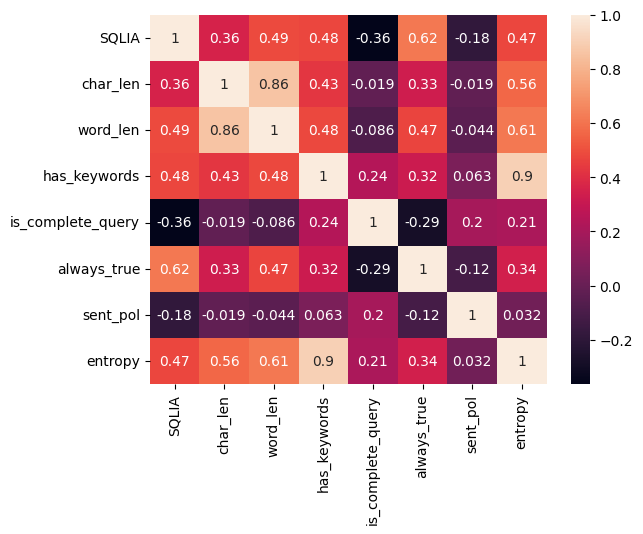

In [103]:
sns.heatmap(mod_data.corr(), annot=True)

###### Analysis

- Entropy distributions of SQLIA and normal queries are quite different, which makes entropy an excellent feature for our problem
- Entropy has a bi-modal distribution for normal queries
- For SQLIA queries, entropy has a complicated non-Gaussian distribution

### Baseline model and feature selection  
Here our goal is to find out the words or series of words which are common in attacks.  
We can either use TFIDF or simple tokenization which will find out the pattern in n-gram features to identify the attack.  
**NOTE**: We will first try with all cleaned data.

In [104]:
mod_data.shape

(38201, 11)

In [105]:
mod_data.head()

,Query,SQLIA,char_len,query_proc,small,word_len,has_keywords,is_complete_query,always_true,sent_pol,entropy
1126,or 3 = 3 --,True,11,or <num> = <num> --,or 3 = 3 --,5,True,True,True,0.000000,1.921928
1128,add plain text ne te quaesiveris extra,False,38,add plain text ne te quaesiveris extra,add plain text ne te quaesiveris extra,7,True,True,False,-0.107143,2.807355
1129,"man star; soul render honest perfect man, comm...",False,99,"man star; soul render honest perfect man, comm...","man star; soul render honest perfect man, comm...",15,True,True,False,0.360000,3.906891
1131,epilogue beaumont fletcher’s honest man’s fort...,False,136,epilogue beaumont fletcher’s honest man’s fort...,epilogue beaumont fletcher’s honest man’s fort...,19,True,False,False,0.600000,4.247928
1186,"on saying, what i sacredness traditions, i liv...",False,112,"on saying, what i sacredness traditions, i liv...","on saying, what i sacredness traditions, i liv...",18,True,True,False,0.068182,4.058814


In [106]:
mod_data['SQLIA'].value_counts()/mod_data.shape[0] * 100

False    67.129133
True     32.870867
Name: SQLIA, dtype: float64

In [107]:
# Removing unwanted columns
mod_data.drop(['Query', 'small'], axis=1, inplace=True)

In [108]:
# Converting columns with boolean values to numerical
col_names = ['SQLIA', 'has_keywords', 'is_complete_query', 'always_true']
for col in col_names:
    mod_data[col] = mod_data[col].apply(int)

In [109]:
mod_data.head()

,SQLIA,char_len,query_proc,word_len,has_keywords,is_complete_query,always_true,sent_pol,entropy
1126,1,11,or <num> = <num> --,5,1,1,1,0.000000,1.921928
1128,0,38,add plain text ne te quaesiveris extra,7,1,1,0,-0.107143,2.807355
1129,0,99,"man star; soul render honest perfect man, comm...",15,1,1,0,0.360000,3.906891
1131,0,136,epilogue beaumont fletcher’s honest man’s fort...,19,1,0,0,0.600000,4.247928
1186,0,112,"on saying, what i sacredness traditions, i liv...",18,1,1,0,0.068182,4.058814


In [110]:
mod_data['SQLIA'].value_counts()/mod_data.shape[0] * 100

0    67.129133
1    32.870867
Name: SQLIA, dtype: float64

In [111]:
def prepare_data(data):
    
    X = data.drop('SQLIA', axis=1)
    y = data['SQLIA'].apply(int)
    X_tr, X_te, y_tr, y_te = train_test_split(X, y, test_size=0.25, random_state=0)    
    X_tr = X_tr.drop('query_proc', axis=1)
    X_te = X_te.drop('query_proc', axis=1)
    return X_tr, X_te, y_tr, y_te

In [112]:
X_train, X_test, y_train, y_test = prepare_data(mod_data)

In [113]:
# mod_data.drop('query_proc', axis='columns', inplace=True)
# X = mod_data.drop('SQLIA', axis=1)
# y = mod_data['SQLIA'].apply(int)
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42, stratify=y)

In [114]:
X_train

,char_len,word_len,has_keywords,is_complete_query,always_true,sent_pol,entropy
31049,6,1,0,1,0,0.00,-0.000000
1334,74,4,1,1,0,0.00,2.000000
23394,70,10,1,0,0,0.00,3.321928
24087,8,2,0,1,0,0.00,1.000000
2965,71,17,1,0,0,0.25,3.286896
...,...,...,...,...,...,...,...
28593,38,7,1,1,0,0.00,2.807355
27971,10,1,0,1,0,0.00,-0.000000
26271,24,1,0,1,0,0.00,-0.000000
29079,35,7,1,1,0,0.00,2.807355


In [115]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((28650, 7), (9551, 7), (28650,), (9551,))

## Tokenization

**Count Vectorizer** 

In [116]:
vectorizer = CountVectorizer(ngram_range=(1,3), max_features=2500, stop_words = invalid_tokens)
X_train_vec = vectorizer.fit_transform(X_train)
X_test_vec = vectorizer.transform(X_test)

In [117]:
# vectorizer = CountVectorizer(ngram_range=(1,3), max_features=2500, stop_words = 'english')
# X_train_vec = vectorizer.fit_transform(X_train)
# X_test_vec = vectorizer.transform(X_test)

## Visualization 

## Evaluating Models

In [118]:
def benchmark(clf, x, y, X_test_vec, y_test, custom_name=False):
    X_train_vec = x
    y_train = y
    from time import time
    print("_" * 80)
    print("Training: ")
    print(clf)
    t0 = time()
    clf.fit(X_train_vec, y_train)
    train_time = time() - t0
    print(f"train time: {train_time:.3}s")

    t0 = time()
    pred = clf.predict(X_test_vec)
    test_time = time() - t0
    print(f"test time:  {test_time:.3}s")

    score = accuracy_score(y_test, pred)
    print(f"Accuracy Score of {clf} :   {score:.3}")
    
    global f1 
    f1 = f1_score(y_test, pred)
    print(f"F1 score of {clf} : {f1: .3}")
    
    confusion = confusion_matrix(y_test, pred)

    TP = confusion[1, 1]
    TN = confusion[0, 0]
    FP = confusion[0, 1]
    FN = confusion[1, 0]

    global sensitivity
    sensitivity = TP / float(FN + TP)
    print(f"sensitivity of {clf} = : {sensitivity: .3}")

    global specificity 
    specificity = TN / (TN + FP)
    print(f"specificity of {clf} = : {specificity: .3}")
    

    global Precision 
    Precision = TP / float(TP + FP)
    
    print (f"Precision of {clf}= : {Precision: .3}")

    if hasattr(clf, "coef_"):
        print(f"dimensionality of {clf} : {clf.coef_.shape[1]}")
        print(f"density of {clf} : {density(clf.coef_): .3}")
        print()

    print()
    if custom_name:
        clf_descr = str(custom_name)
    else:
        clf_descr = clf.__class__.__name__
    return clf_descr, score, f1, Precision, train_time, test_time, sensitivity


In [408]:
from sklearn.naive_bayes import GaussianNB
results = []
for clf, name in (
    (GaussianNB(), "Gaussian Naive Bayes"),
    (MLPClassifier(), "Multi-Layer Perceptron"),
    (SVC(), "SVC"),
    (RndFC(), "Random Forest Classifier"),
    #(KNN(), "K Nearest Neighbors Classifier")
):
    print("=" * 80)
    print(name)
    results.append(benchmark(clf,X_train, y_train, X_test, y_test, name))

Gaussian Naive Bayes
________________________________________________________________________________
Training: 
GaussianNB()
train time: 0.0148s
test time:  0.11s
Accuracy Score of GaussianNB() :   0.879
F1 score of GaussianNB() :  0.782
sensitivity of GaussianNB() = :  0.663
specificity of GaussianNB() = :  0.984
Precision of GaussianNB()= :  0.954

Multi-Layer Perceptron
________________________________________________________________________________
Training: 
MLPClassifier()
train time: 60.4s
test time:  0.0364s
Accuracy Score of MLPClassifier() :   0.961
F1 score of MLPClassifier() :  0.937
sensitivity of MLPClassifier() = :  0.898
specificity of MLPClassifier() = :  0.991
Precision of MLPClassifier()= :  0.98

SVC
________________________________________________________________________________
Training: 
SVC()
train time: 25.8s
test time:  8.03s
Accuracy Score of SVC() :   0.885
F1 score of SVC() :  0.796
sensitivity of SVC() = :  0.68
specificity of SVC() = :  0.986
Precision o

In [217]:
X_test_vec

<9x9 sparse matrix of type '<class 'numpy.int64'>'
	with 9 stored elements in Compressed Sparse Row format>

In [376]:
from prettytable import PrettyTable

table = PrettyTable()
table.field_names = ["Model", " Accuracy ", "F1 Score ", "Precision ", "Train Time ", "Test Time ", "Sensitivity "]

table.add_row([ results[0][0], round( results[0][1], 3), round( results[0][2], 3), round( results[0][3], 3),  round( results[0][4], 3),  round( results[0][5], 3),  round( results[0][6], 3) ])
table.add_row([ results[1][0], round( results[1][1], 3), round( results[1][2], 3), round( results[1][3], 3),  round( results[1][4], 3),  round( results[1][5], 3),  round( results[1][6], 3) ])
table.add_row([ results[2][0], round( results[2][1], 3), round( results[2][2], 3), round( results[2][3], 3),  round( results[2][4], 3),  round( results[2][5], 3),  round( results[2][6], 3) ])
table.add_row([ results[3][0], round( results[3][1], 3), round( results[3][2], 3), round( results[3][3], 3),  round( results[3][4], 3),  round( results[3][5], 3),  round( results[3][6], 3) ])


print(f'{table}\n')

IndexError: list index out of range

# Compare model accuracy with other models


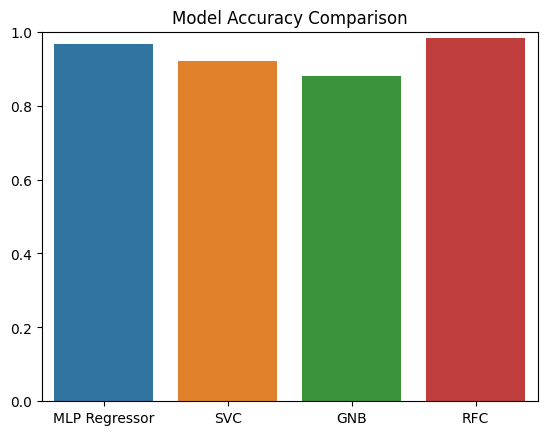

In [119]:
models = ['MLP Regressor', 'SVC', "GNB", "RFC" ]
accuracies = [0.967, 0.921, 0.879, 0.984]

sns.barplot(x=models, y=accuracies)
plt.ylim(0, 1)
plt.title('Model Accuracy Comparison')
plt.show()

In [382]:
models = [ MLPClassifier(hidden_layer_sizes=100), RndFC(), GaussianNB(), SVC(C=10) ]

In [385]:
def compare_models():
    global mlp_score, knn_score, rndfc_score, mnbc_score, svc_score
    for model in models:
        model.fit(X_train, y_train)
        if str(model).strip('()') == 'MLPClassifier':
            mlp_score = model.score(X_train, y_train)
        elif str(model).strip('()') == 'RandomForestClassifier':
            rndfc_score = model.score(X_train, y_train)
        elif str(model).strip('()') == 'GaussianNB':
            mnbc_score = model.score(X_train, y_train)
        elif str(model).strip('()') == 'SVC':
            svc_score = model.score(X_train, y_train)

In [386]:
compare_models()

### Conclusion

+ RFC Classifier is the most accurate classifier compared to MLP Classifier, and SVC which are more accurate than Multinomial Naive Bayes Classifier

## Modeling

1. Using count vectorized data

In [121]:
from sklearn.naive_bayes import GaussianNB
model = GaussianNB()
model.fit(X_train, y_train)

GaussianNB()

In [122]:
y_pred = model.predict(X_test)

In [123]:
# import scikitplot as skplt
# skplt.estimators.plot_learning_curve(model, X, y,
#                                      cv=7, shuffle=True, scoring="r2", n_jobs=-1,
#                                      figsize=(8,6), title_fontsize="small", text_fontsize="small",
#                                      title="Random Forest Classifier Learning Curve ");

In [124]:
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay

              precision    recall  f1-score   support

           0       0.86      0.98      0.92      6409
           1       0.95      0.66      0.78      3142

    accuracy                           0.88      9551
   macro avg       0.91      0.82      0.85      9551
weighted avg       0.89      0.88      0.87      9551



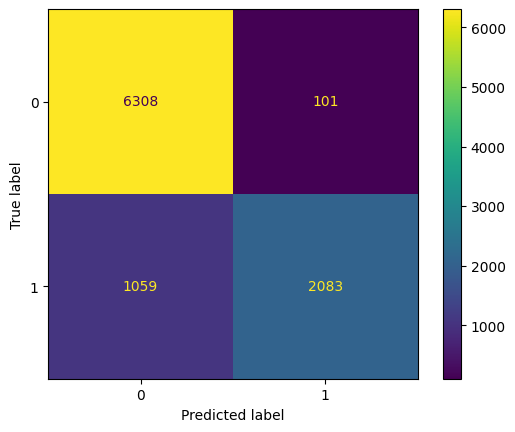

In [125]:
grid_preds = model.predict(X_test)
confusion_matrix(y_test,grid_preds)             # confusion matrix

ConfusionMatrixDisplay.from_estimator(model, X_test, y_test)  # plotting confusion matrix
print(classification_report(y_test, grid_preds))        # classification report


### Evaluation Metrics

In [522]:

eval_model(model, train_data=X_train, train_label=y_train, model_name='MLP Classifier')

AttributeError: 'MLPClassifier' object has no attribute 'n_layers_'

In [125]:
mlp = MLPClassifier()
mlp.fit(X_train_vec, y_train)

NameError: name 'X_train_vec' is not defined

In [521]:
def eval_model(model, train_data, train_label, model_name = 'Model', cv=3):
  print(f'Evaluating {model_name}...')  
  global y_test
  train_acc_score = model.score(train_data, train_label)
  test_acc_score = model.score(X_test_vec, y_test)
  
  print('Training Accuracy = ',round(train_acc_score*100, 4), ' %')
  print('Testing Accuracy = ',round(test_acc_score*100, 4), ' %')
  
  y_predictions = model.predict(X_test_vec)
  print(f"F1 Score for {model_name}: {round(f1_score(y_test, y_predictions)*100,4)} %")
  confusion_mat = ConfusionMatrixDisplay(confusion_matrix(y_test, y_predictions))

  cross_val_f1 = cross_val_score(model, train_data, train_label, cv=cv, scoring='f1')
  print(f'cross_validation f1-scores for {model_name} \n {cross_val_f1}')

  fpr, tpr, thresholds = roc_curve(y_test, y_predictions)
  roc_auc = auc(fpr, tpr)
  roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name=model_name)
  print("roc_auc = ", round(roc_auc*100,4))

  figure, ((ax1, ax2)) = plt.subplots(1, 2, figsize=(15,6))
  confusion_mat.plot(ax=ax1)
  ax1.set_title('Confustion matrix')
  roc_display.plot(ax=ax2)
  ax2.set_title('ROC-AUC')
  figure.suptitle(model_name)


In [ ]:
y_pred = mlp.predict(X_test_vec)
eval_model(model, train_data=X_train_vec, train_label=y_train, model_name='SVM Classifier')

In [143]:
def measure_performance(model, X_test, y_true, map_labels):
    # predict on testset
    df_pred_test = X_test_vec.copy()
    #df_pred_test['Class'] = y_test
    df_pred_test['Pred'] = model.predict(X_test_vec)
    if map_labels:
        df_pred_test['Pred'] = df_pred_test['Pred'].map({1: 0, -1: 1})
    #df_pred_test['Outlier_Score'] = model.decision_function(X_test)

    # measure performance
    #y_true = df_pred_test['Class']
    x_pred = df_pred_test['Pred'] 
    matrix = confusion_matrix(x_pred, y_true)

    sns.heatmap(pd.DataFrame(matrix, columns = ['Actual', 'Predicted']),
                xticklabels=['Regular [0]', 'Fraud [1]'], 
                yticklabels=['Regular [0]', 'Fraud [1]'], 
                annot=True, fmt="d", linewidths=.5, cmap="YlGnBu")
    plt.ylabel('Predicted')
    plt.xlabel('Actual')
    
    print(classification_report(x_pred, y_true))
    
    model_score = score(x_pred, y_true,average='macro')
    print(f'f1_score: {np.round(model_score[2]*100, 2)}%')
    
    return model_score

model_name = 'Isolation Forest (baseline)'
print(f'{model_name} model')

map_labels = True
model_score = measure_performance(model, X_test_vec, y_test, map_labels)

performance_df = pd.DataFrame().append({'model_name':model_name, 
                                    'f1_score': model_score[0], 
                                    'precision': model_score[1], 
                                    'recall': model_score[2]}, ignore_index=True)

Isolation Forest (baseline) model


IndexError: Index dimension must be 1 or 2

## HyperParameter Tuning

In [ ]:
model = MLPClassifier()
params = {'hidden_layer_sizes':((1,), (50,),(100,),(200,),(300,),(500,200,))}
clf = GridSearchCV(estimator = MLP_model_gcv, param_grid = params, n_jobs=-1, scoring='f1')
model.fit(X_train_tfidfvec, y_train)

In [ ]:
cv_results = pd.DataFrame(clf._results_)
with pd.option_context('display.max_colwidth', None):
  display(cv_results.loc[:,['params', 'mean_test_score','std_test_score',	'rank_test_score']].sort_values('rank_test_score'))

In [ ]:
cv_results.best_params_

In [ ]:
MLP_model_tuned = MLPClassifier(hidden_layer_sizes=(,))
MLP_model_tuned.fit(X_train_tfidfvec, y_train)
eval_model(MLP_model_tuned, train_data=X_train_tfidfvec, train_label=y_train, model_name='MLP Classifier Tuned')

roc_auc =  99.5


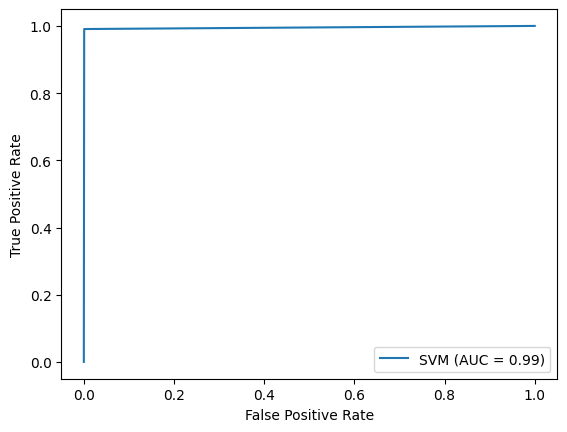

In [267]:
fpr, tpr, thresholds = roc_curve(y_test, model_y_pred)
roc_auc = auc(fpr, tpr)
display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name='SVM')
display.plot()
print("roc_auc = ", round(roc_auc*100,2))

roc_auc =  99.59


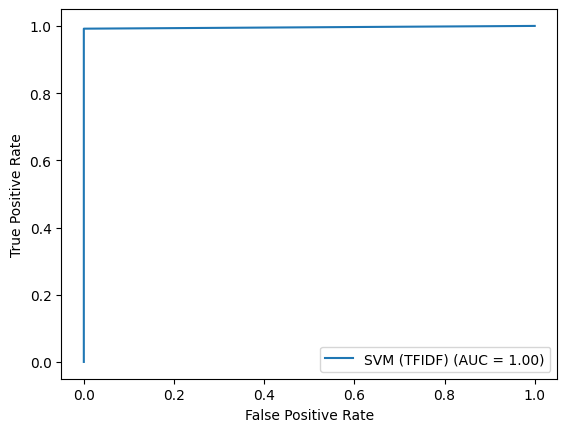

In [268]:
fpr, tpr, thresholds = roc_curve(y_test, model_tfidf_y_pred)
roc_auc = auc(fpr, tpr)
display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name='SVM (TFIDF)')
display.plot()
print("roc_auc = ", round(roc_auc*100,2))